In [1]:
import torch
from sklearn.model_selection import train_test_split

# load data from data folder(we"re in notebooks folder)
sim_arr_tensor = torch.load('./data/sim_arr_tensor.pt')

# train test split
train_data, test_data = train_test_split(
    sim_arr_tensor, test_size=0.2, random_state=42)
train_data, val_data = train_test_split(
    train_data, test_size=0.2, random_state=42)


# print the largest value in the tensor
print(len(sim_arr_tensor))

3010


/tmp/ipykernel_1955209/2409607313.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  sim_arr_tensor = torch.load('./data/sim_arr_tensor.pt')


In [2]:
from torch import nn

hyperparameters_dict = {
    "num_layers": 5,
    "poolsize": [2, 2, 2, 2, 5],
    "channels": [3, 12, 7, 7, 11, 12],
    "kernel_sizes": [15, 10, 14, 14, 14],
    "dilations": [5, 5, 3, 3, 1],
    "activations": [nn.SiLU, nn.Tanh, nn.Softplus, nn.SiLU, nn.SiLU],
    "lr": 0.0002568457560593339,
    "batch_size": 32
}

In [3]:
from cluster_acc import adj_rand_index
from lightning.pytorch.callbacks.early_stopping import EarlyStopping
import lightning as L
from torch.utils.data import DataLoader
from models import LitAE

lit_model = LitAE(hyperparameters=hyperparameters_dict, cluster=True)

trainer = L.Trainer(callbacks=[EarlyStopping(monitor="val_loss")])
trainer.fit(model=lit_model,
            train_dataloaders=DataLoader(train_data, batch_size=hyperparameters_dict["batch_size"], num_workers=31),
            val_dataloaders=DataLoader(val_data, batch_size=hyperparameters_dict["batch_size"], num_workers=31))

# save encoder, decoder weights
torch.save(lit_model.model.encoder.state_dict(), "./saved_models/encoder_weights.pt")
torch.save(lit_model.model.decoder.state_dict(), "./saved_models/decoder_weights.pt")

2024-08-29 11:27:49.500746: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-29 11:27:49.516631: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-29 11:27:49.521477: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-08-29 11:27:49.533746: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-08-29 11:27:51.082366: W tensorflow/comp

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [4]:
import optuna
from sklearn.cluster import HDBSCAN
from cluster_acc import purity, adj_rand_index

feature_array = lit_model.model.encoder(sim_arr_tensor).detach().numpy()
feature_array = feature_array.reshape(feature_array.shape[0], -1)


def objective(trial):
    hdbscan_model = HDBSCAN(min_cluster_size=trial.suggest_int('min_cluster_size', 2, 10),
                            min_samples=trial.suggest_int(
                                'min_samples', 1, 1000),
                            cluster_selection_epsilon=trial.suggest_float(
                                'cluster_selection_epsilon', 0.0, 1.0),
                            allow_single_cluster=False)
    hdbscan_model.fit(feature_array)
    labels = hdbscan_model.labels_
    return adj_rand_index(labels)


study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

print(study.best_params)

hdbscan_model = HDBSCAN(min_cluster_size=study.best_params['min_cluster_size'],
                        min_samples=study.best_params['min_samples'],
                        cluster_selection_epsilon=study.best_params['cluster_selection_epsilon'],
                        allow_single_cluster=False)
hdbscan_model.fit(feature_array)
labels = hdbscan_model.labels_
print(f'Purity: {purity(labels)}')
print(f'ARI: {adj_rand_index(labels)}')

[I 2024-08-29 11:46:29,995] A new study created in memory with name: no-name-25276222-c3cc-4f72-9229-9c9168e325f4
[I 2024-08-29 11:46:30,313] Trial 0 finished with value: 0.05343670838754681 and parameters: {'min_cluster_size': 10, 'min_samples': 541, 'cluster_selection_epsilon': 0.7131434280569035}. Best is trial 0 with value: 0.05343670838754681.
[I 2024-08-29 11:46:30,748] Trial 1 finished with value: 0.0 and parameters: {'min_cluster_size': 3, 'min_samples': 769, 'cluster_selection_epsilon': 0.06907218715512353}. Best is trial 0 with value: 0.05343670838754681.
[I 2024-08-29 11:46:30,993] Trial 2 finished with value: 0.12985336963676478 and parameters: {'min_cluster_size': 6, 'min_samples': 383, 'cluster_selection_epsilon': 0.6897427634386927}. Best is trial 2 with value: 0.12985336963676478.
[I 2024-08-29 11:46:31,147] Trial 3 finished with value: 0.3765416080649315 and parameters: {'min_cluster_size': 7, 'min_samples': 200, 'cluster_selection_epsilon': 0.5435206058490268}. Best i

{'min_cluster_size': 5, 'min_samples': 3, 'cluster_selection_epsilon': 0.9605872173618848}
Purity: 0.9953488372093023
ARI: 0.9938909992106677


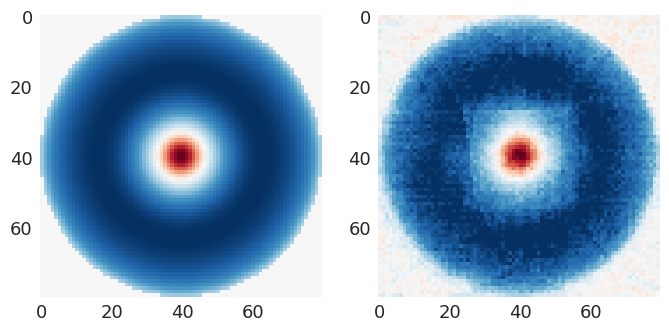

1_skyrmion


In [5]:
from plot import random_recon
random_recon(lit_model.model, sim_arr_tensor)

/home/tummalas/hyper-param-optim-4-vector-field-clustering/.venv/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


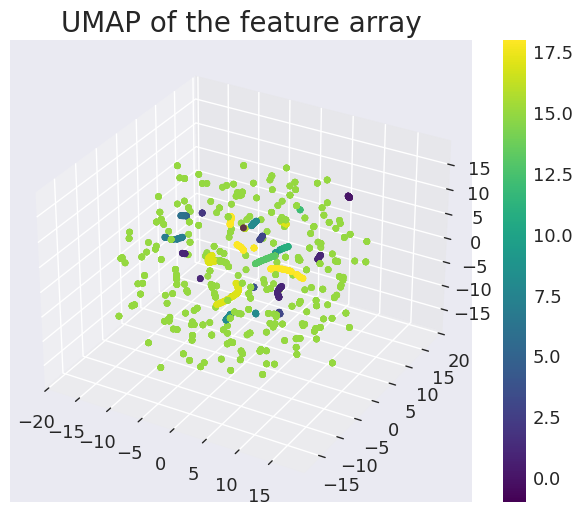

In [6]:
from plot import umap_plot
umap_plot(feature_array, labels)

In [7]:
from plot import class_config
class_config(labels)

Number of classes:  19


/home/tummalas/hyper-param-optim-4-vector-field-clustering/plot/plotting.py:214: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



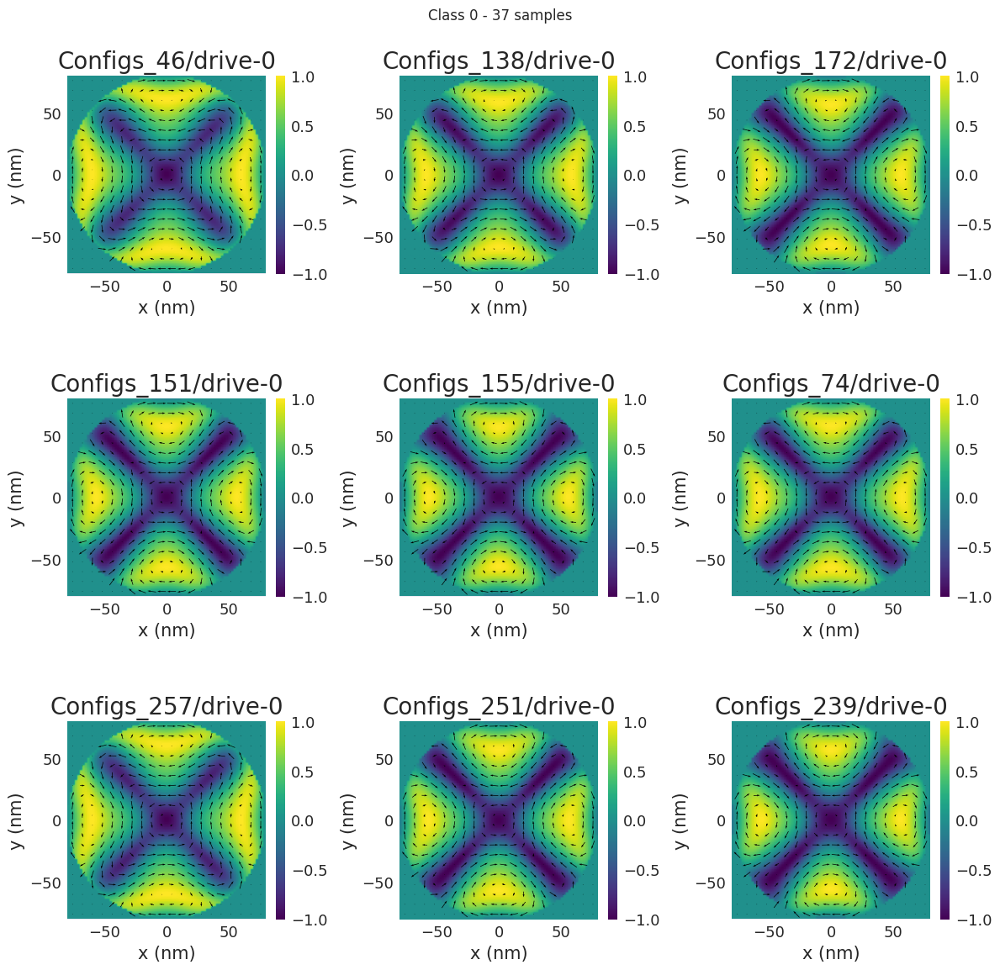

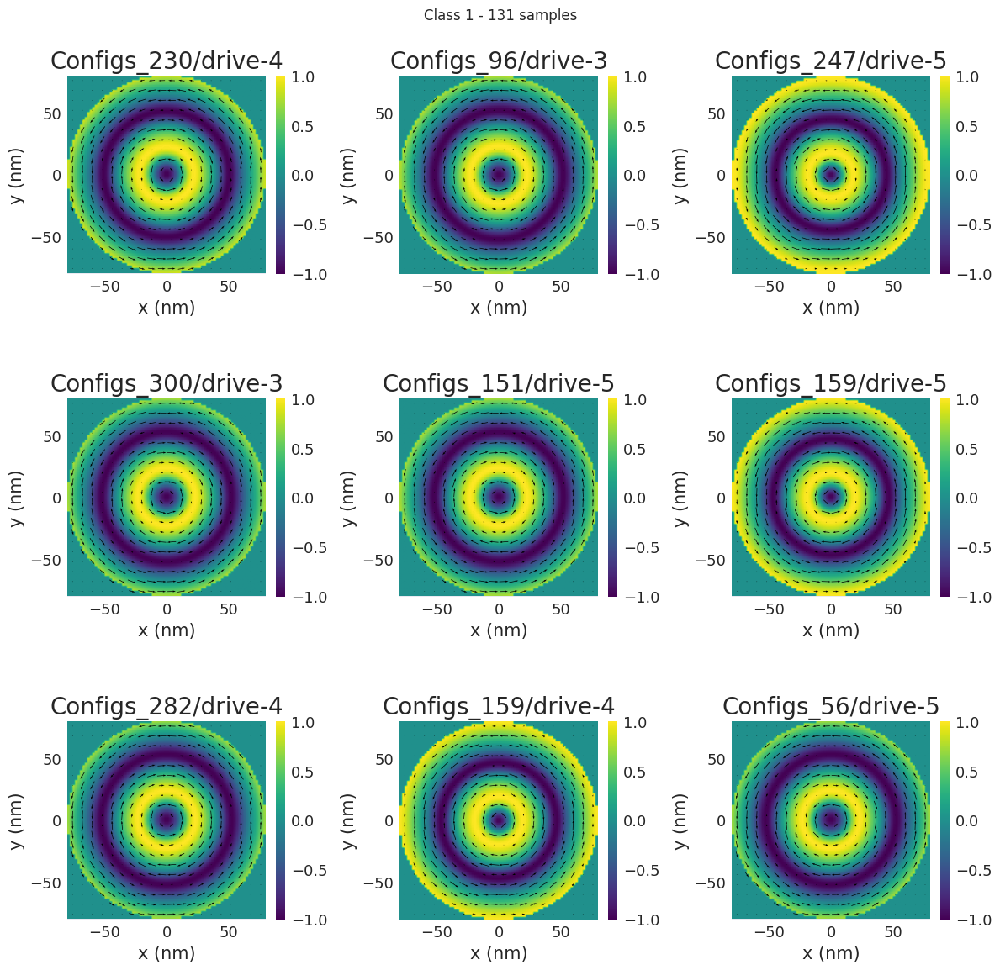

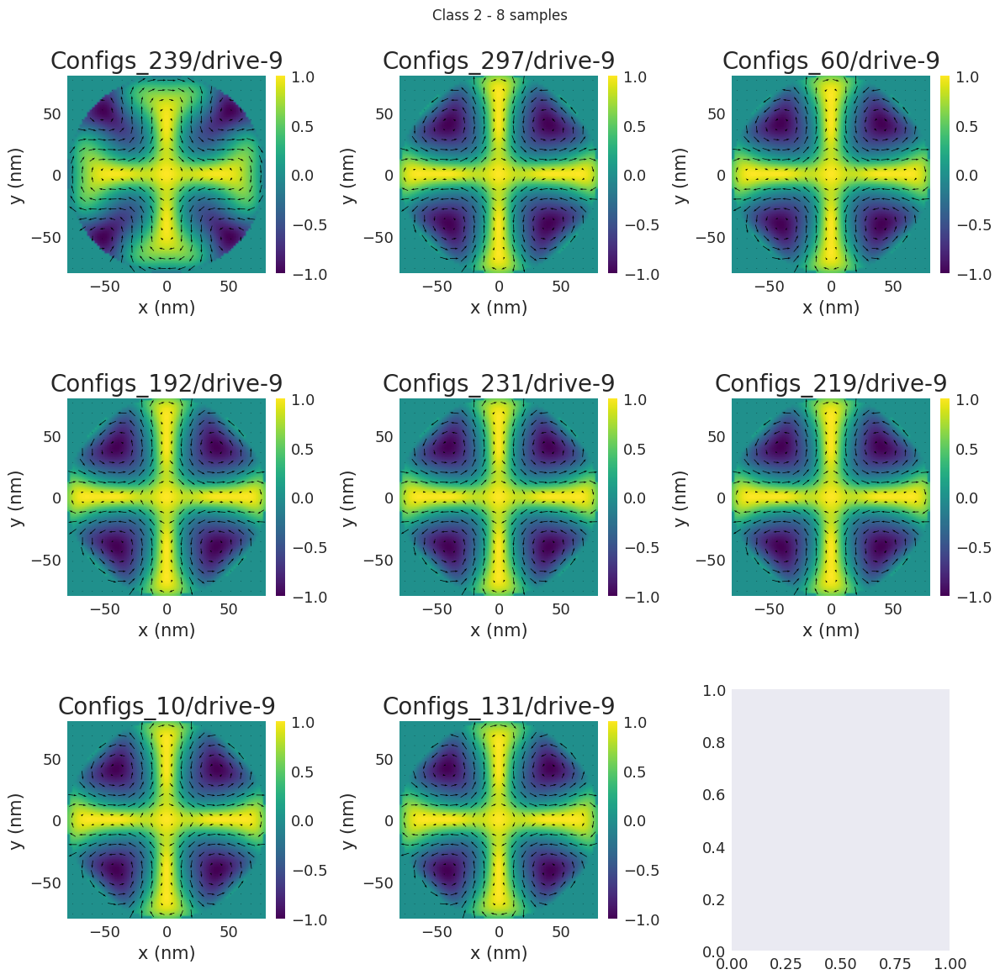

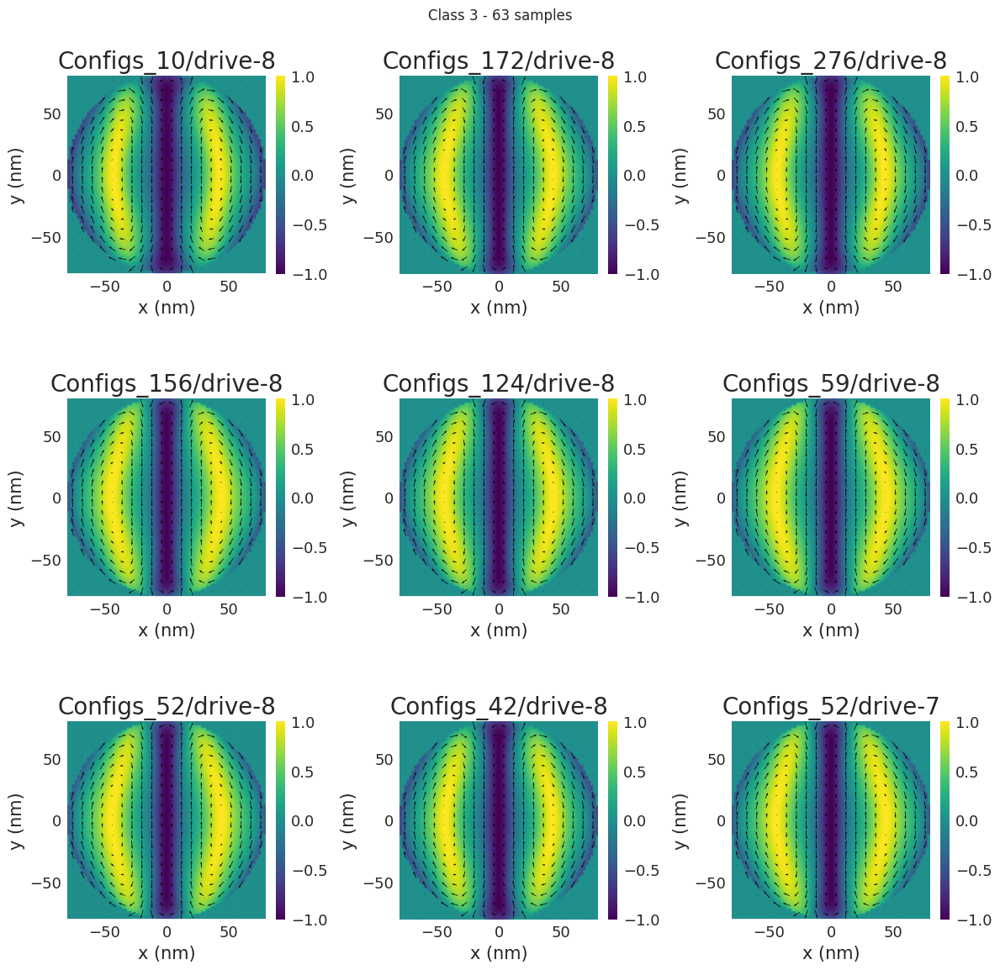

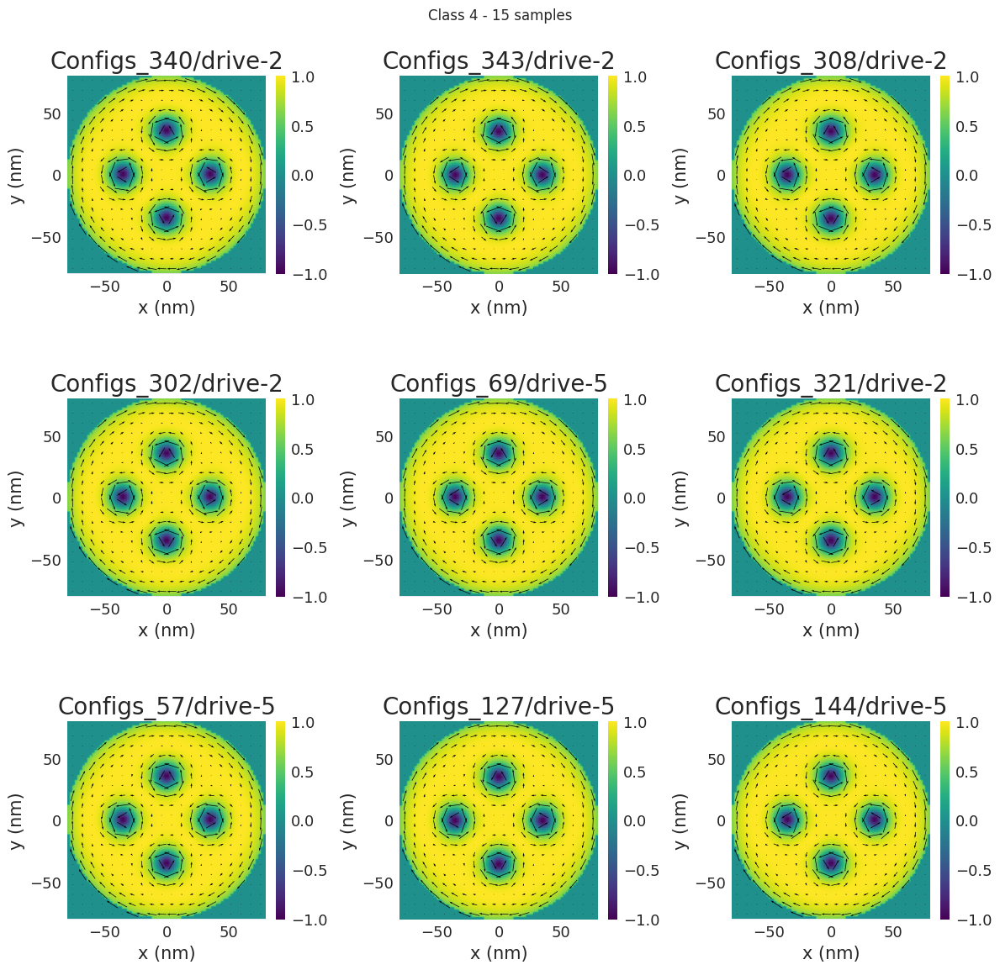

...

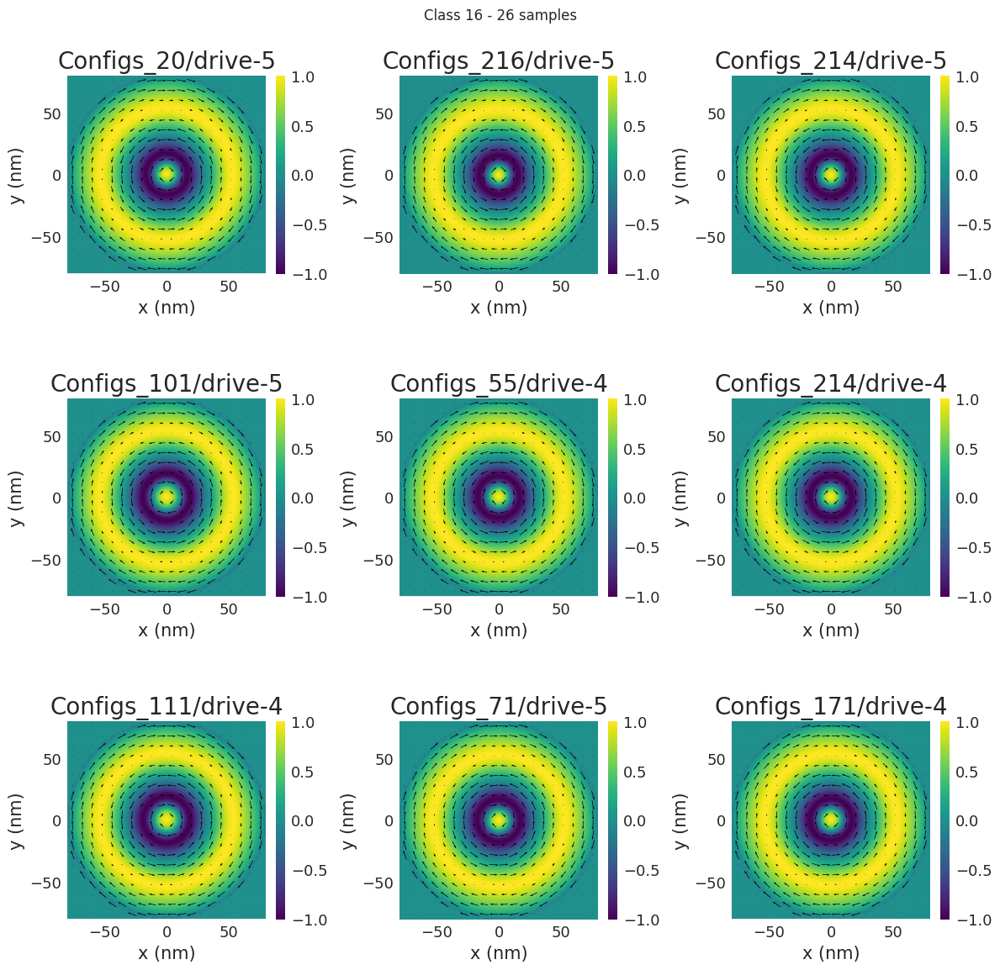

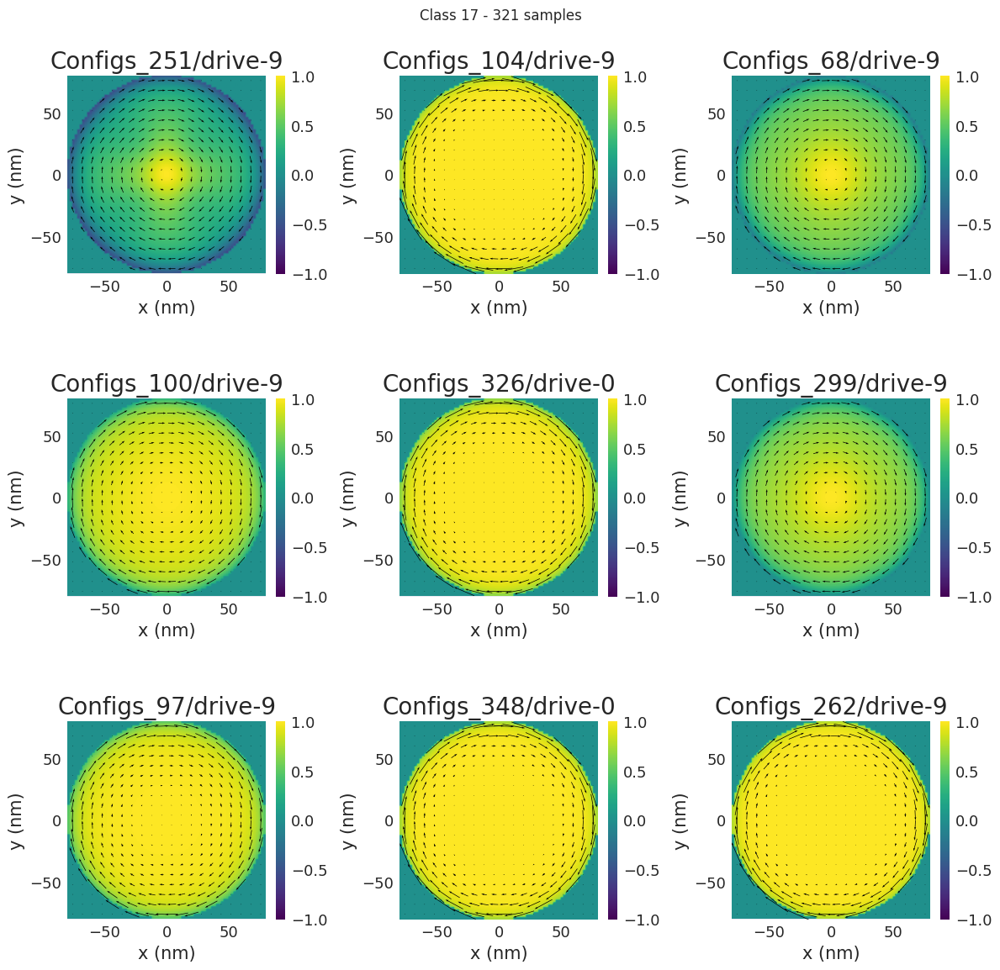

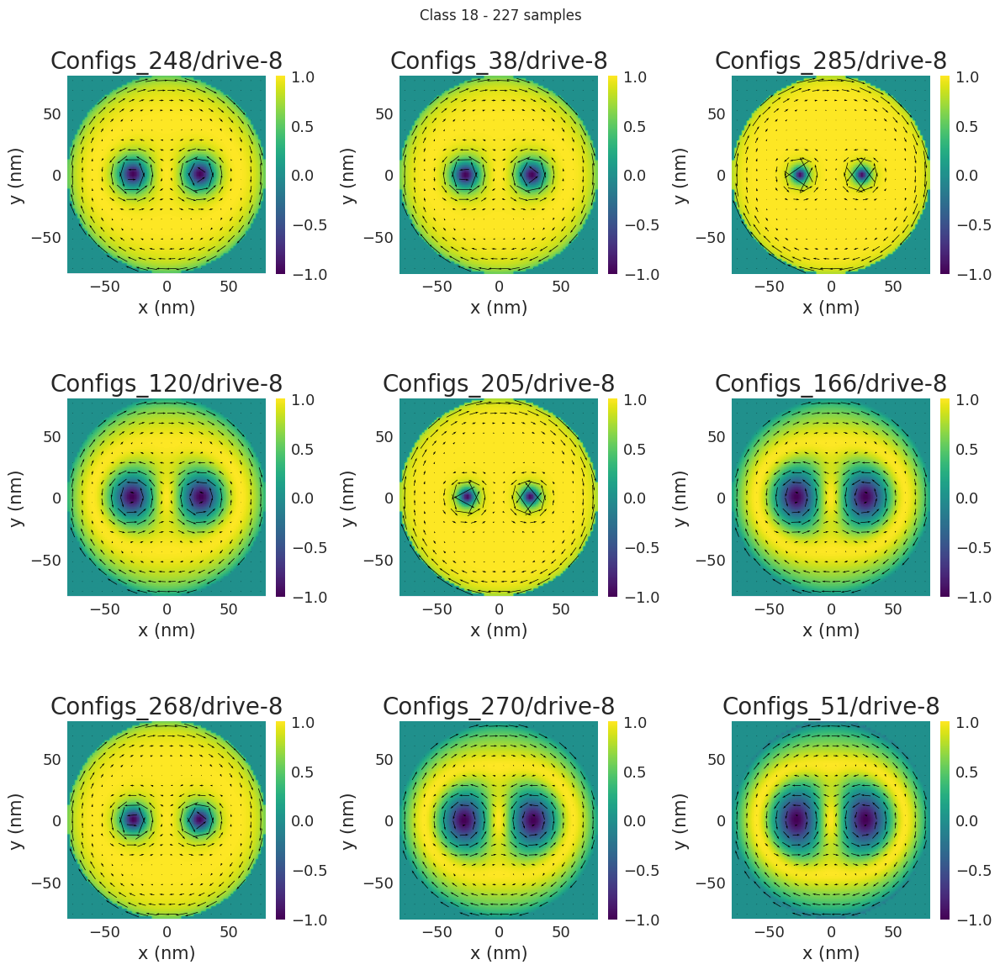

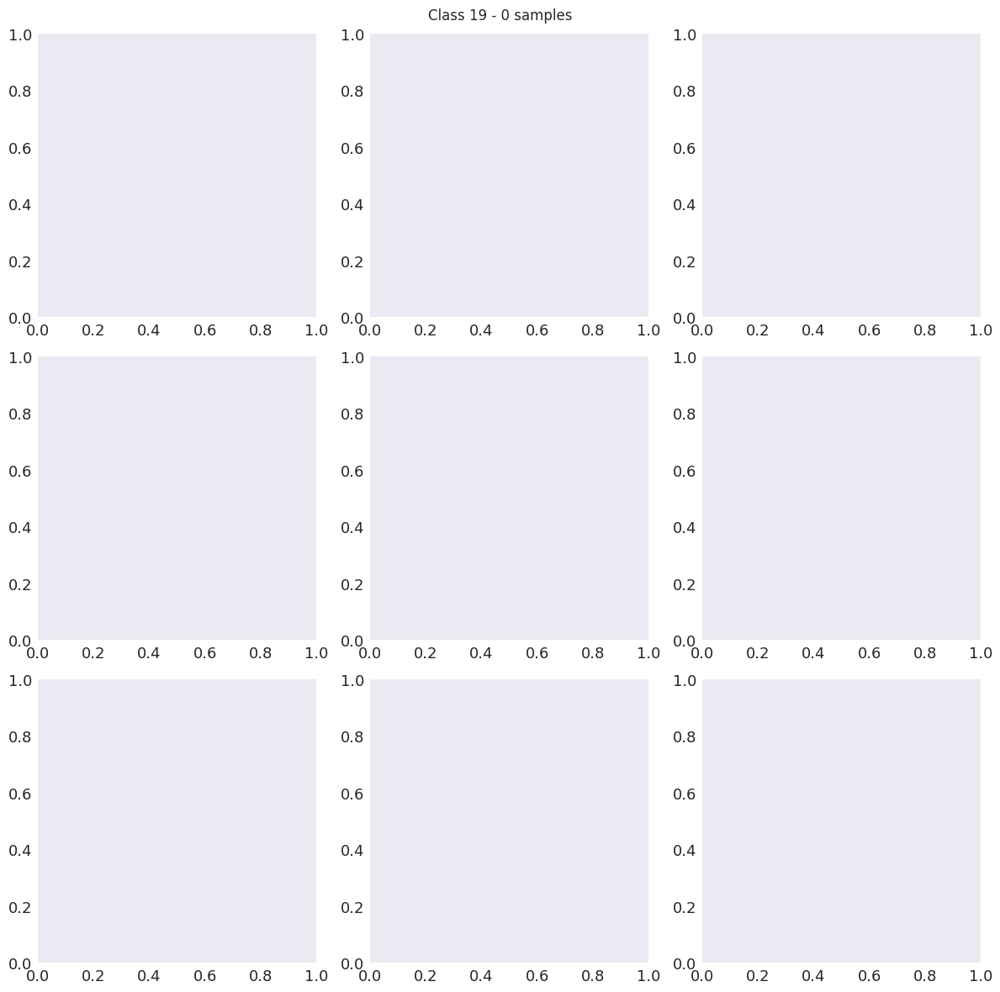

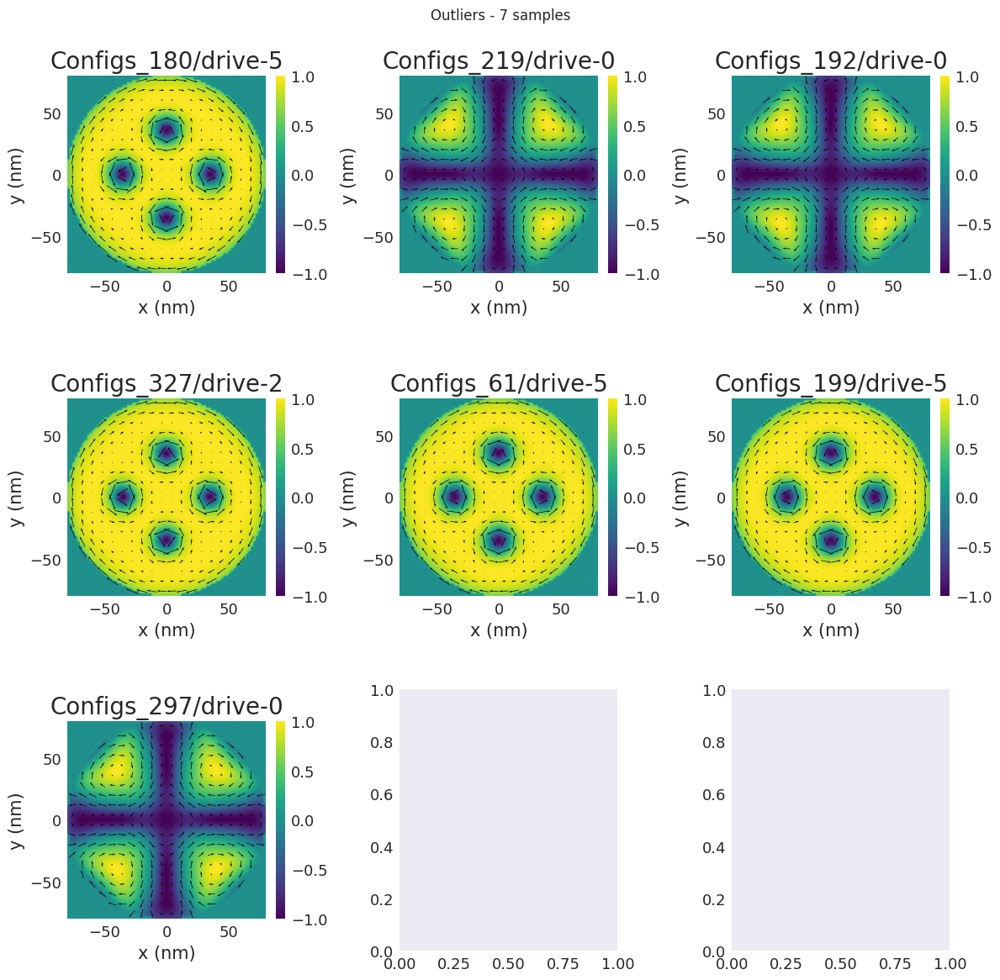

In [8]:
from plot import plot_all_examples

plot_all_examples(labels)